# 📚 Experience Sharing
- Signal preprocessing
- Method comparation

**Contact**: senmeeja #9894 🤙

**Special credit** 🙏:
- VarinPond #3582
- bossboss #9574
- TÆ #6089

# Connect to kaggle and download dataset

## Connect to Google drive
Note: The purpose of connecting to google drive is to access my **kaggle.json** file that I saved in google drive. 

In addition, I'm going to saved the preprocessed data to my drive for convenience when coding.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Download dataset from kaggle

In [ ]:
!mkdir ~/.kaggle
!cp /content/drive/MyDrive/kaggle_json/kaggle.json ~/.kaggle/     # : EDIT HERE : Change your path to your kaggle_json
!chmod 600 ~/.kaggle/kaggle.json

# Show list of available dataset
!kaggle datasets list

ref                                                                title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
-----------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
zusmani/pakistan-toshakhana-files                                  Pakistan ToshaKhana Files                             1MB  2023-03-15 16:25:43           2150         83  1.0              
ramkrijal/tomato-daily-prices                                      Tomato Daily Prices                                  10KB  2023-03-10 15:39:14            950         31  1.0              
themrityunjaypathak/covid-cases-and-deaths-worldwide               Covid Cases and Deaths WorldWide                      8KB  2023-02-01 12:22:51          13534        457  1.0              
datascientistanna/customers-dataset          

In [ ]:
# Select the competitions
!kaggle competitions download -c uwb-pose-prediction

 99% 977M/987M [00:08<00:00, 145MB/s]
100% 987M/987M [00:08<00:00, 116MB/s]


In [ ]:
# unzip dataset
!unzip uwb-pose-prediction.zip &> /dev/null

# Data separation
Separate raw data into folder based on their classes

**Credit**: This code was modified from *P'Boss EXP* basis code 🙏

In [ ]:
import pandas as pd
import os
import glob 
import shutil

# Read class data
annotation_df = pd.read_csv("/content/annotations.csv")
annotation_df

# create directories and class folders
dir_name = "/content/raw_data"
os.makedirs(dir_name)
for i in range(7):
  os.makedirs(os.path.join(dir_name, str(i)))

# Copy files into thier classes
indir = "/content/train/train"
outdir = "/content/raw_data"

for file_ in os.listdir(indir):
    for i in range(len(annotation_df)):
        if file_.split(".npy")[0] == annotation_df['id'].iloc[i]:
            file_old = os.path.join(indir, file_)
            file_new = os.path.join(outdir, str(annotation_df['class'].iloc[i]))
            shutil.copy(file_old,file_new)
        
# Check number of file in each directories
for i in range(7):
  print(f"Class {i} =", len(glob.glob(os.path.join(dir_name, str(i), "*"))))
print("Sum =", len(glob.glob(os.path.join(dir_name, "*", "*"))))

Class 0 = 50
Class 1 = 99
Class 2 = 43
Class 3 = 111
Class 4 = 116
Class 5 = 107
Class 6 = 121
Sum = 647


# File preparation
Received data from UWB sensor has shape equal to (2560, 56) which are
- 56 sample index of sensor (The less sample index means the closer to sensor)
- 256 x 10 Time steps (FPS x seconds)

Note: The data value is complex number in form of (I+jQ)

In [ ]:
import os
import numpy as np
import glob

baseURL = "/content/raw_data"

# Get all files from directories
# e.g. file_list[i][j] -> Choose npy number j th from class i
file_list = []
for i in range(7):
  files = glob.glob(baseURL+'/'+str(i)+'/*')
  files.sort()
  file_list.append(files)

# Visualization

In [ ]:
# Get sample of image for testing
test_img_path = file_list[0][0]
test_img = np.load(test_img_path)
test_img = np.transpose(test_img)
test_img.shape

(56, 2560)

## Distance

### Surface visualization

In [ ]:
import numpy as np
import plotly.graph_objs as go
import cmath

# Create a meshgrid of x and y values
x = np.arange(0, test_img.shape[1])
y = np.arange(0, test_img.shape[0])
X, Y = np.meshgrid(x, y)

# Set up amplitude to distance (absolute of data)
Z = np.abs(test_img)

# Create a surface plot of the data using plotly
fig = go.Figure(data=[go.Surface(x=X, y=Y, z=Z)])

# Set the axis titles
fig.update_layout(scene=dict(xaxis_title='Time (1/256 sec)',
                             yaxis_title='Sampler index',
                             zaxis_title='Distance'))

fig.show()

### Time domain & amplitude plotting (Bird-eye view)


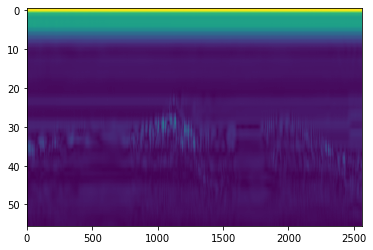

In [ ]:
import matplotlib.pyplot as plt

plt.imshow(np.abs(test_img), aspect='auto')

## Velocity

### Surface visualization

In [ ]:
import numpy as np
import plotly.graph_objs as go
import cmath

# Create a meshgrid of x and y values
x = np.arange(0, test_img.shape[1])
y = np.arange(0, test_img.shape[0])
X, Y = np.meshgrid(x, y)

# Set up amplitude to velocity (arctan of data)
Z = np.angle(test_img)

# Create a surface plot of the data using plotly
fig = go.Figure(data=[go.Surface(x=X, y=Y, z=Z)])

# Set the axis titles
fig.update_layout(scene=dict(xaxis_title='Time (1/256 sec)',
                             yaxis_title='Sampler index',
                             zaxis_title='Velocity'))

fig.show()

### Time domain & amplitude plotting (Bird-eye view)

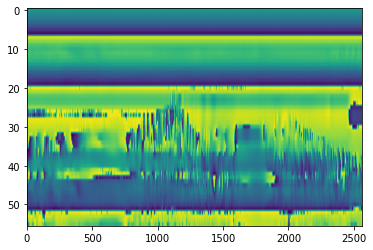

In [ ]:
import matplotlib.pyplot as plt

plt.imshow(np.angle(test_img), aspect='auto')

# Signal Filtering

In [ ]:
# Set class name for displaying
class_name = [
    'Stumble',
    'Jump',
    'Lay down',
    'Run',
    'Stand -> Sit',
    'Sit -> Stand/Walk',
    'Walk'
]

## Method1: Using filter

In [ ]:
import numpy as np
import scipy.signal as signal

# Band-pass filter
def bp_filter_signal(complex_img, low=0.008, high=0.1):
  """
  : Description :   Filter image with band pass filter
  : Input :       
    - complex_img   2D array of complex number
    - low           minimum frequency to collect
    - high          maximum frequency to collect
  : Output :
    - filter_img    result image after filtering
  """

  # === Band-pass filter === #
  img_fft = np.fft.fft2(complex_img)

  low_cutoff = low
  high_cutoff = high

  # Create a mask for the filter function
  ny, nx = img_fft.shape
  u, v = np.meshgrid(np.fft.fftfreq(nx), np.fft.fftfreq(ny))
  d = np.sqrt(u**2 + v**2)
  mask = np.logical_and(d > low_cutoff, d < high_cutoff)

  # Apply the filter to the Fourier transform
  bp_img = img_fft * mask

  # Compute the inverse Fourier transform to get the filtered image
  filter_img = np.fft.ifft2(bp_img).real
  return filter_img

# High-pass then Band-pass filter
def hpbp_filter_signal(complex_img, high_cut=0.0005, low=0.008, high=0.1):
  """
  : Description :   Filter image with High-pass filter then filter with band-pass filter
  : Input :       
    - complex_img   2D array of complex number
    - high_cut      maximum frequency to collect from high-pass filter
    - low           minimum frequency to collect from band-pass filter
    - high          maximum frequency to collect from band-pass filter
  : Output :
    - filter_img    result image after filtering
  """
  # === High-pass filter === #
  filter_order = 3
  b, a = signal.butter(filter_order, high_cut, 'high')
  hp_img = signal.filtfilt(b, a, complex_img)

  # === Band-pass filter === #
  img_fft = np.fft.fft2(hp_img)
  low_cutoff = low
  high_cutoff = high

  # Create a mask for the filter function
  ny, nx = img_fft.shape
  u, v = np.meshgrid(np.fft.fftfreq(nx), np.fft.fftfreq(ny))
  d = np.sqrt(u**2 + v**2)
  mask = np.logical_and(d > low_cutoff, d < high_cutoff)

  # Apply the filter to the Fourier transform
  bp_img = img_fft * mask

  # Compute the inverse Fourier transform to get the filtered image
  filter_img = np.fft.ifft2(bp_img).real
  return filter_img

# Band-pass then High-pass filter
def bphp_filter_signal(complex_img, high_cut=0.0005, low=0.008, high=0.1):
  """
  : Description :   Filter image with Band-pass filter then filter with High-pass filter
  : Input :       
    - complex_img   2D array of complex number
    - high_cut      maximum frequency to collect from high-pass filter
    - low           minimum frequency to collect from band-pass filter
    - high          maximum frequency to collect from band-pass filter
  : Output :
    - filter_img    result image after filtering
  """
  # === Band-pass filter === #
  img_fft = np.fft.fft2(complex_img)

  low_cutoff = low
  high_cutoff = high

  # Create a mask for the filter function
  ny, nx = img_fft.shape
  u, v = np.meshgrid(np.fft.fftfreq(nx), np.fft.fftfreq(ny))
  d = np.sqrt(u**2 + v**2)
  mask = np.logical_and(d > low_cutoff, d < high_cutoff)

  # Apply the filter to the Fourier transform
  bp_img = img_fft * mask

  # Compute the inverse Fourier transform to get the filtered image
  bp_img = np.fft.ifft2(bp_img).real

  # === High-pass filter === #
  filter_order = 3
  b, a = signal.butter(filter_order, high_cut, 'high')
  filter_img = signal.filtfilt(b, a, bp_img)

  return filter_img

### Result

Filter with Band-pass filter

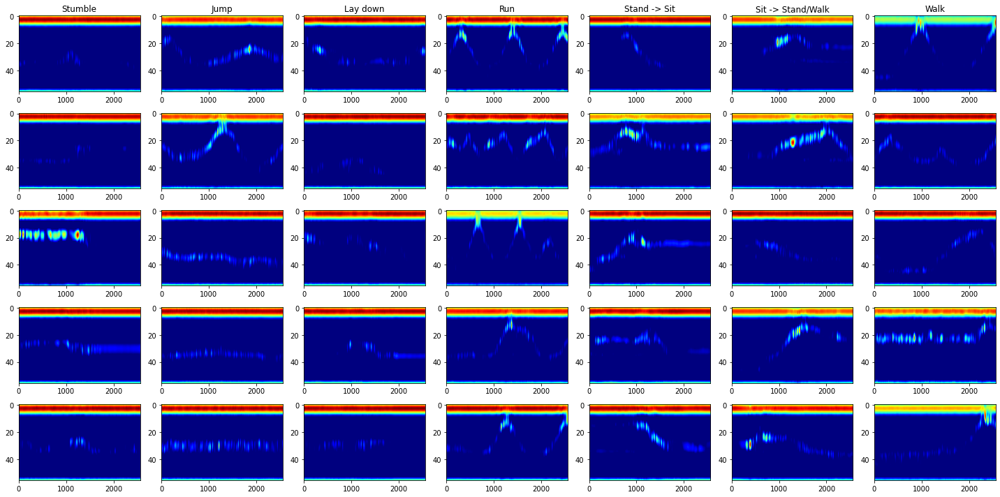

In [ ]:
fig, axs = plt.subplots(5, 7, figsize=(20, 10))

# Iterate over the images and plot each one
for i in range(5):
  for j in range(7):
    sample_img = np.load(file_list[j][i])
    sample_img = np.transpose(sample_img)
    distance_img = np.abs(sample_img)
    filter_img = bp_filter_signal(distance_img, 0.008, 0.1)     # Using bp filter
    filter_img = filter_img.clip(min=0)                       # set minimum value to 0
    axs[i][j].imshow(filter_img, cmap='jet', aspect='auto')
    if i==0:
      axs[i][j].set_title(class_name[j])
plt.tight_layout()
plt.show()

Filter with High-pass then Band-pass filter

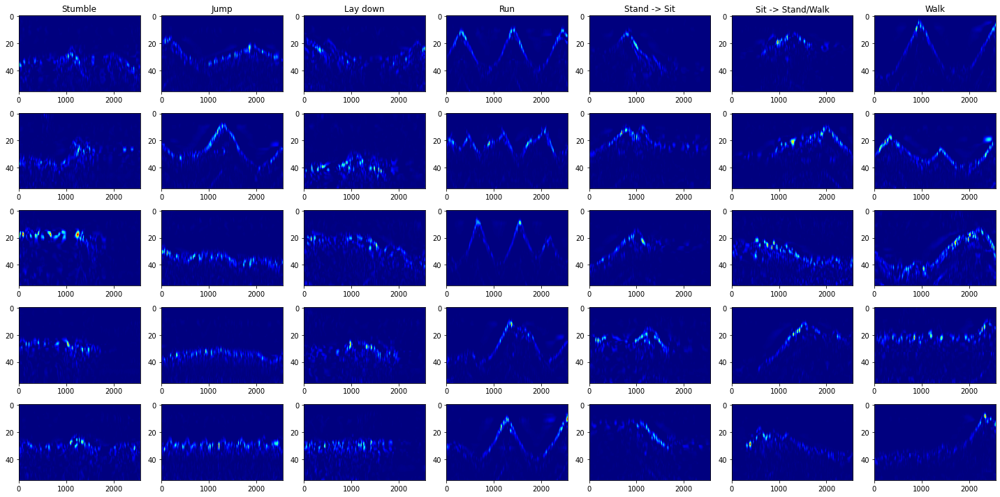

In [ ]:
fig, axs = plt.subplots(5, 7, figsize=(20, 10))

# Iterate over the images and plot each one
for i in range(5):
  for j in range(7):
    sample_img = np.load(file_list[j][i])
    sample_img = np.transpose(sample_img)
    distance_img = np.abs(sample_img)
    filter_img = hpbp_filter_signal(distance_img, 0.004, 0.0001, 1)
    filter_img = filter_img.clip(min=0)
    axs[i][j].imshow(filter_img, cmap='jet', aspect='auto')
    if i==0:
      axs[i][j].set_title(class_name[j])
plt.tight_layout()
plt.show()

Filter with Band-pass then High-pass filter

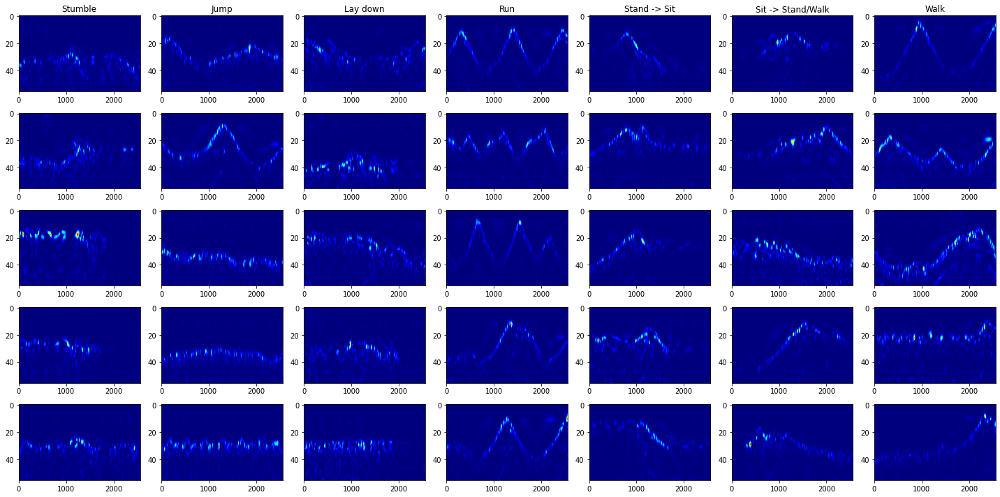

In [ ]:
fig, axs = plt.subplots(5, 7, figsize=(20, 10))

# Iterate over the images and plot each one
for i in range(5):
  for j in range(7):
    sample_img = np.load(file_list[j][i])
    sample_img = np.transpose(sample_img)
    distance_img = np.abs(sample_img)
    filter_img = bphp_filter_signal(distance_img, 0.004, 0.0001, 1)
    filter_img = filter_img.clip(min=0)
    axs[i][j].imshow(filter_img, cmap='jet', aspect='auto')
    if i==0:
      axs[i][j].set_title(class_name[j])
plt.tight_layout()
plt.show()

## Method2: Using Wavelet transform

**Credit**: This code was modified from P'Tae EXP basis code 🙏

### Normal size

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pywt
from PIL import Image

def wavelet_transform(complex_img):
  """
  : Description :   Transform data using wavelet transform
  : Input :       
    - complex_img   2D array of complex number
  : Output :
    - wavelet_img    result image after filtering
  """
  # Perform the 2D Wavelet transform using the Haar wavelet
  coeffs = pywt.dwt2(complex_img, 'haar')

  # Get the approximation and detail coefficients
  cA, (cH, cV, cD) = coeffs

  # Calculate the magnitude of the complex numbers in the approximation coefficients
  mag_wav = np.abs(cA)

  # Normalize the magnitude to the range [0, 255]
  wavelet_img = 255.0 * mag_wav / np.max(mag_wav)

  return mag_wav


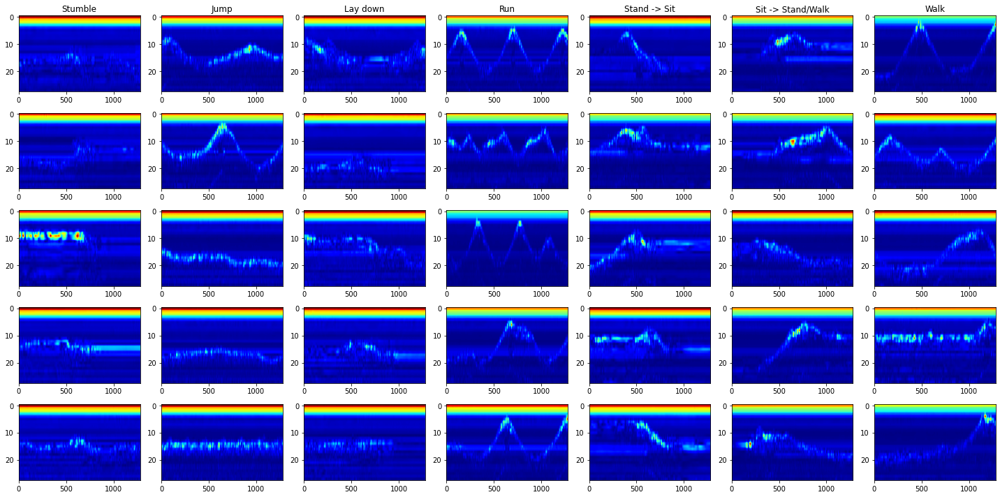

In [ ]:
fig, axs = plt.subplots(5, 7, figsize=(20, 10))

# Iterate over the images and plot each one
for i in range(5):
  for j in range(7):
    sample_img = np.load(file_list[j][i])
    distance_img = np.abs(sample_img)
    filter_img = wavelet_transform(distance_img)
    filter_img = np.transpose(filter_img)
    filter_img = filter_img.clip(min=0)
    axs[i][j].imshow(filter_img, cmap='jet', aspect='auto')
    if i==0:
      axs[i][j].set_title(class_name[j])
plt.tight_layout()
plt.show()

### Up-sampling

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pywt
from PIL import Image

def wavelet_upsampling(complex_img, upsamp_factor=2):
  """
  : Description :   Transform data using wavelet transform
  : Input :       
    - complex_img    2D array of complex number
    - upsamp_factor  Up sampling factor
  : Output :
    - wavelet_img    result image after filtering
  """
  # Perform the 2D Wavelet transform using the Haar wavelet
  coeffs = pywt.dwt2(complex_img, 'haar')

  # Get the approximation and detail coefficients
  cA, (cH, cV, cD) = coeffs

  # Calculate the magnitude of the complex numbers in the approximation coefficients
  mag_wav = np.abs(cA)

  # Normalize the magnitude to the range [0, 255]
  wavelet_img = 255.0 * mag_wav / np.max(mag_wav)

  # Upsample the image
  wavelet_img = np.kron(wavelet_img, np.ones((upsamp_factor,upsamp_factor)))

  return wavelet_img


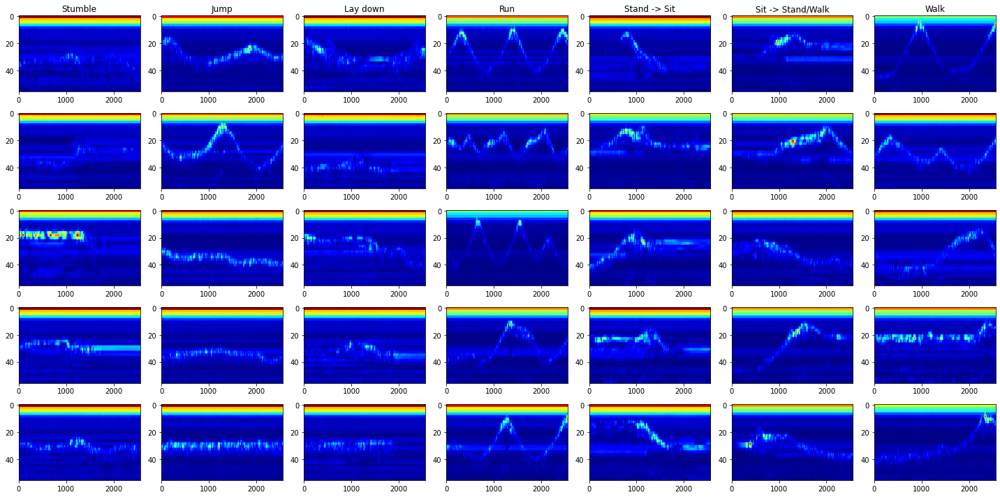

In [ ]:
fig, axs = plt.subplots(5, 7, figsize=(20, 10))

# Iterate over the images and plot each one
for i in range(5):
  for j in range(7):
    sample_img = np.load(file_list[j][i])
    distance_img = np.abs(sample_img)
    filter_img = wavelet_upsampling(distance_img)
    filter_img = np.transpose(filter_img)
    filter_img = filter_img.clip(min=0)
    axs[i][j].imshow(filter_img, cmap='jet', aspect='auto')
    if i==0:
      axs[i][j].set_title(class_name[j])
plt.tight_layout()
plt.show()

## Method3: Sliding Range Frequency (Naming by myself 😂)
**Credit**: Idea from N'Pond EXP

In [ ]:
def range_time(IQ_data):
    n_rd_history = 256
    frame = []
    frames = []

    for iqini in IQ_data:
        if len(frame)<n_rd_history:
            frame.append(iqini)
        else:  
            frames.append(np.copy(frame))
            frame.append(iqini)
            frame = frame[1::]
            
    return np.stack(frames)

def range_frequency(datas):
    Range_frequency_frame = []
    for data in datas:
        # Range-Doppler
        rd = np.fft.fft(data, axis=0)
        rd = np.fft.fftshift(rd, axes=0)
        rd = np.abs(rd)
        DBrd = 20 * np.log10(rd+1e-10)
        Range_frequency_frame.append(DBrd)
    return np.stack(Range_frequency_frame)

def srf_transform(complex_img, half=False):
  img = range_time(complex_img)
  img = range_frequency(img)
  if half:
    img = img[:, :img.shape[1]//2, :]
  srf_img = img.reshape(img.shape[0]*img.shape[1], img.shape[2]).real
  return srf_img.T

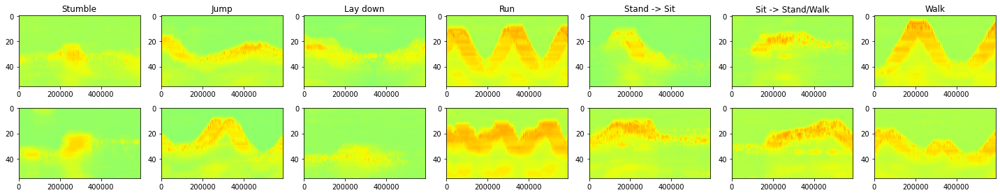

In [ ]:
fig, axs = plt.subplots(2, 7, figsize=(20, 4))

# Iterate over the images and plot each one
for i in range(2):
  for j in range(7):
    sample_img = np.load(file_list[j][i])
    distance_img = np.abs(sample_img)
    filter_img = srf_transform(distance_img)
    axs[i][j].imshow(filter_img, cmap='jet', aspect='auto')
    if i==0:
      axs[i][j].set_title(class_name[j])
plt.tight_layout()
plt.show()

# Save image

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm

output_dir = "<your path>"    # : EDIT HERE : Add your output directory where the full output path is <your path>/train/class_id/filename.png
dpi = 100                     # : EDIT HERE : Select you dpi of output image
height = 224                  # : EDIT HERE : Select you image height
width = 640                   # : EDIT HERE : Select you image width

# Export images
for i, class_files in enumerate(file_list):
  for j, file_path in enumerate(tqdm(class_files)):
    # select image
    image = np.load(file_list[j][i])
    distance_img = np.abs(image)                              # : EDIT HERE : select your amplitude (abs: distance, angle: velocity)
    filter_img = srf_transform(distance_img)                  # : EDIT HERE : select your function

    # SAVE FIG
    fig, axs = plt.subplots(1, 1, figsize=(width/dpi, height/dpi))
    axs.imshow(filter_img, cmap='jet', aspect='auto')         # : EDIT HERE : select your camp
    axs.axis('off')
    filename = file_path.split('/')[-1].replace('.npy', '.png')
    fig.savefig(os.path.join(output_dir, "train", str(i), filename), dpi=100, bbox_inches='tight', pad_inches=0)
    plt.close(fig)